# Imports

In [29]:
#-- Necessary Imports
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader,Subset
from sklearn.preprocessing import StandardScaler,MinMaxScaler
import glob
import datetime as dt
from tqdm import tqdm
from os.path import exists
import os
import subprocess

import matplotlib.pyplot as plt
import matplotlib as mpl

%matplotlib inline
font = {'size'   : 10}
mpl.rc('font', **font)

from matplotlib.cm import get_cmap
name = "Dark2"
cmap = get_cmap(name)  # type: matplotlib.colors.ListedColormap
colors = cmap.colors


# Data
Download from here: https://zenodo.org/record/4906336#.Y1EWhi8RqDU

In this part of the notebook, we check the data (plot it, etc.) before starting the learning experiments.

In [30]:
# we suppose that you have wget installed (linux/mac) and unzip; otherwise, please download the data using your browser
if not os.path.exists('AndyData-lab-prescientTeleopICub'):
   subprocess.run("wget https://zenodo.org/record/5913573/files/AndyData-lab-prescientTeleopICub.zip?download=1  -O andy.zip", shell=True)
   subprocess.run("unzip andy.zip", shell=True)

data_path = 'AndyData-lab-prescientTeleopICub/datasetMultipleTasks'


In [31]:
# load the data
import glob


# we make a dataset so that we can use mini-batches, etc.
# this is only for LSTM and MLP (not for ProMP)
class TrajectoryData(Dataset): # testing will use the same scaler as training
  def __init__(self, glob_dir, skip_data, column, input_length, output_length, range, scaler = None):
    self.column = column
    self.skip_data = skip_data
    self.input_length = input_length
    self.output_length = output_length
    self.episodes = self._load_files(glob_dir, skip_data, column, range)
    self.episodes_scaled, self.scaler = self._scale_episodes(self.episodes, scaler)
    self.x, self.y = self._make_dataset(self.episodes_scaled, input_length, output_length)
    self.len = self.x.shape[0]
    print("Dataset loaded, length:", self.x.shape[0])

  def __getitem__(self,index):               
    return self.x[index],self.y[index]
  
  def __len__(self):
    return self.len

  def _make_dataset(self, episodes, input_length, output_length):
    x = torch.FloatTensor([])
    y = torch.FloatTensor([])
    for ep in episodes:
      x_ep, y_ep = self._make_x_y_pairs(ep,  input_length, output_length)
      x = torch.cat([x, x_ep], dim=0)
      y = torch.cat([y, y_ep], dim=0)
    return x, y

  # This could use padding to get recognition from the first time-steps
  def _make_x_y_pairs(self, episode, input_length, output_length):
    x = [episode[i:i+input_length] for i in range(len(episode)-input_length-output_length)]
    y = [episode[i+input_length:i+input_length+output_length] for i in range(len(episode)-input_length-output_length)]   
    #-- use the stack function to convert the list of 1D tensors
    # into a 2D tensor where each element of the list is now a row
    x = torch.stack(x)
    y = torch.stack(y)
    return x, y


  # scale all the episodes (same scaling for all the data)
  def _scale_episodes(self, episodes, other_scaler):
    # first, get all the data in a single tensor
    train_all = np.array([])
    for l in episodes:
      train_all = np.concatenate((train_all, l)) # useful for normalization
   
    # scale according to all the data
    if other_scaler == None:
      scaler = StandardScaler()
      scaler.fit(train_all.reshape(-1,1))
    else:
      scaler = other_scaler

    #scale each episode
    episodes_scaled = []
    for l in episodes:
        scaled = scaler.transform(l.reshape(-1,1))
        episodes_scaled += [torch.FloatTensor(scaled).view(-1)]
    return episodes_scaled, scaler
  
  # load a set of trajectory, keeping them separate
  def _load_files(self, glob_dir, skip_data, column, range):
    files = glob.glob(glob_dir)
    files = files[int(range[0] * len(files)):int(range[1] * len(files)) - 1]
    episodes = []
    if len(files) == 0:
      print("ERROR: no files for this dataset!", glob_dir)
      raise FileExistsError(glob_dir)
    for f in files:
      if not os.path.exists(f):
        print("ERROR, file does not exist:", f)
        raise FileExistsError(f)
      l =  np.loadtxt(f, delimiter=',')
      episodes += [l[::skip_data, column]]
    return episodes



# parameters
column = 2 # column in the data
skip_data = 10 # subsampling -> 100 Hz to 10Hz

train_periods = 10 # number of timesteps as input
prediction_periods = 10 # number of predicted timesteps

data_training = TrajectoryData(f'{data_path}/*/p*.csv', skip_data, column, train_periods, prediction_periods, [0, 0.5])
data_testing = TrajectoryData(f'{data_path}/*/p*.csv', skip_data, column, train_periods, prediction_periods, [0.5, 1.0], scaler=data_training.scaler)



Dataset loaded, length: 6345
Dataset loaded, length: 6838


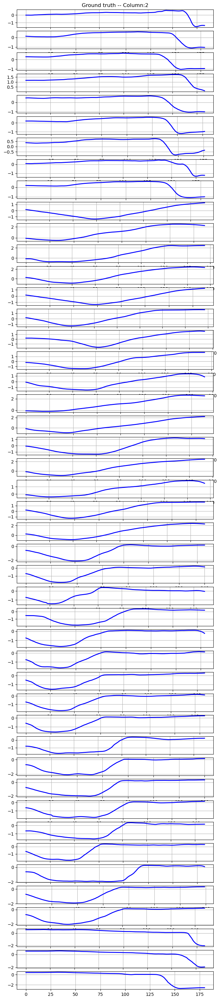

In [32]:
# plot the ground truth data (scaled) for each trajectory
fig = plt.figure(figsize=(8,40))
for i in range(0, len(data_training.episodes_scaled)):
    ax = fig.add_subplot(len(data_training.episodes_scaled), 1, i+1)
    if (i == 0):
        ax.set_title(f'Ground truth -- Column:{column}')

    ax.grid(True)
    ground_truth = data_training.episodes_scaled[i]
    x = np.arange(len(ground_truth))
    ax.plot(x, ground_truth, "b-",linewidth=2)

plt.savefig('ground_truth-scaled', dpi=600)

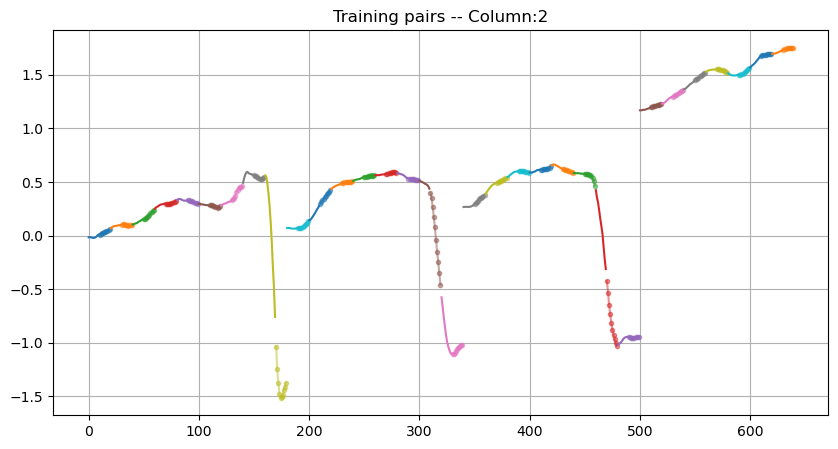

In [33]:
# plot the xy pairs
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(1, 1, 1)
ax.set_title(f'Training pairs -- Column:{column}')
ax.grid(True)

x = np.arange(len(data_training.x))
i = 0
for i in range(0, int(len(data_training.x) / 10), data_training.input_length + data_training.output_length):
    color = next(ax._get_lines.prop_cycler)['color']
    ax.plot(x[i:i +  data_training.input_length], data_training.x[i], color=color)
    ax.plot(x[i +  data_training.input_length:i +  data_training.input_length + data_training.output_length], data_training.y[i], marker='.', alpha=0.5, color=color)

plt.savefig('plot0', dpi=600)

# LSTM

In [34]:
# define the LSTM neural network
class LSTM(nn.Module):
    """
    input_size - will be 1 in this example since we have only 1 predictor (a sequence of previous values)
    hidden_size - Can be chosen to dictate how much hidden "long term memory" the network will have
    output_size - This will be equal to the prediciton_periods input to get_x_y_pairs
    """
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.input_size = input_size
        self.output_size = output_size
        self.num_layers = 1

        # input -> output
        # batch_first=False : (seq_len, batch_size, features) -> (seq_len, batch_size, hidden_size).
        # batch_first=True: (batch_size, seq_len, features) -> (batch_size, seq_len, hidden_size).
        # unbatched: (seq_length, input_size) -> (seq_len, hidden_size)
        self.lstm = nn.LSTM(input_size=input_size, 
                            hidden_size=hidden_size,
                            num_layers=self.num_layers, 
                            batch_first=True,
                            dropout=0)
        
        # we use the sequence of all the hidden state to predict the output
        # linear expect [batch_size, *, nb_features]
        self.linear = nn.Linear(hidden_size * output_size, output_size)
        
    def forward(self, x, hidden=None):
        batch_size = x.shape[0]
        seq_length = x.shape[1]
        if hidden==None:
            self.hidden = (torch.zeros(self.num_layers, batch_size, self.hidden_size),
                           torch.zeros(self.num_layers, batch_size, self.hidden_size))
        else:
            self.hidden = hidden
            
        """
        inputs need to be in the right shape as defined in documentation
        - https://pytorch.org/docs/stable/generated/torch.nn.LSTM.html
        
        lstm_out - will contain the hidden states from all times in the sequence
        self.hidden - will contain the current hidden state and cell state
        """
        shape = (batch_size, seq_length, 1)# we don't have the 1 in the dataset for now
        lstm_out, self.hidden = self.lstm(x.view(shape), self.hidden)
        # the linear predictor can use the list of all the hidden states if it wants (and not only the end)
        # this might be useful because we want to predict all the n next steps
        # we can't use view here because the stride does not match?
        out = lstm_out.reshape(batch_size, -1)
        predictions = self.linear(out)  #self.linear(lstm_out.view(len(x), -1))
        
        return predictions, self.hidden

## Training

In [35]:
# training (this takes time!)
# instantiate the LSTM model
lstm_model = LSTM(input_size=1, hidden_size=10, output_size=prediction_periods)
print(lstm_model)
criterion = nn.MSELoss()
optimizer = optim.Adam(lstm_model.parameters(), lr=0.001)

epochs = 50
lstm_model.train()
loss_list = []

train_loader = DataLoader(dataset=data_training, batch_size=16, shuffle=True)
for epoch in tqdm(range(epochs+1)):
    for x,y in train_loader:#zip(x_train, y_train):
        y_hat, _ = lstm_model(x)
        loss = criterion(y_hat, y)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        loss_list += [loss.item()]   

print("Last training loss:", loss_list[-1])

LSTM(
  (lstm): LSTM(1, 10, batch_first=True)
  (linear): Linear(in_features=100, out_features=10, bias=True)
)


100%|██████████| 51/51 [00:47<00:00,  1.07it/s]

Last training loss: 0.002659947145730257


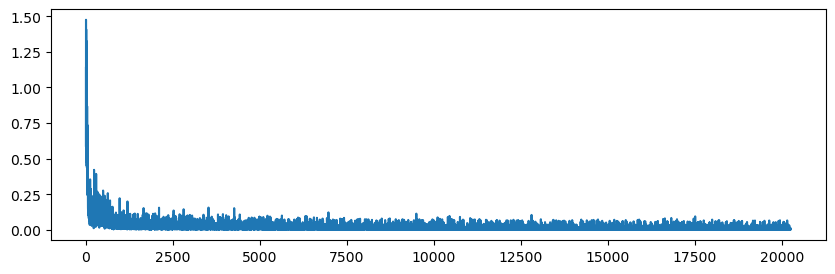

In [36]:
# plot the loss
fig = plt.figure(figsize=(10,3))
ax = fig.add_subplot(1,1,1)
ax.plot(loss_list)

## Results

In [37]:
# compute the loss
def eval_loss(model, dataset):
    mse = nn.MSELoss()
    model.eval()
    loss = 0
    for i in tqdm(range(0, len(dataset))):
        with torch.no_grad():
            x,y = dataset[i]
            y_hat,_ = model(x.view(1, -1))
            loss += mse(y_hat, y.view(1, -1)).item()
    return loss / len(dataset)

train_loss = eval_loss(lstm_model, data_training)
test_loss =  eval_loss(lstm_model, data_testing)

print("Train loss:", train_loss)
print("Test loss (expect some overfitting!):", test_loss)


100%|██████████| 6838/6838 [00:02<00:00, 3282.24it/s]

Train loss: 0.00801954260525115
Test loss (expect some overfitting!): 1334.2653426432475


In [38]:
#evaluation / we always use the same scaler as the scaling of new trajectory is unknown
# we eval for all the timesteps

def eval_model(model, dataset):
    model.eval()
    preds = []
    x_preds = []
        
    # for all episodes (replications of the task)
    for i in tqdm(range(0, len(dataset.episodes))):
        e_preds = []
        e_x_preds = []
        scaled = dataset.episodes_scaled[i]
        # query for all the points
        for x in range(0, len(scaled) - train_periods - 1):
            with torch.no_grad():
                predictions, _ = model(scaled[x:x+train_periods].view(1, -1))
            #-- Apply inverse transform to undo scaling
            predictions = dataset.scaler.inverse_transform(np.array(predictions.reshape(-1,1)))
            e_preds += [predictions]
            e_x_preds += [x + train_periods]
        preds += [e_preds]
        x_preds += [e_x_preds]
    return x_preds, preds

# this is for both training & testing
x_preds, preds = eval_model(lstm_model, data_testing)


100%|██████████| 47/47 [00:02<00:00, 18.70it/s]


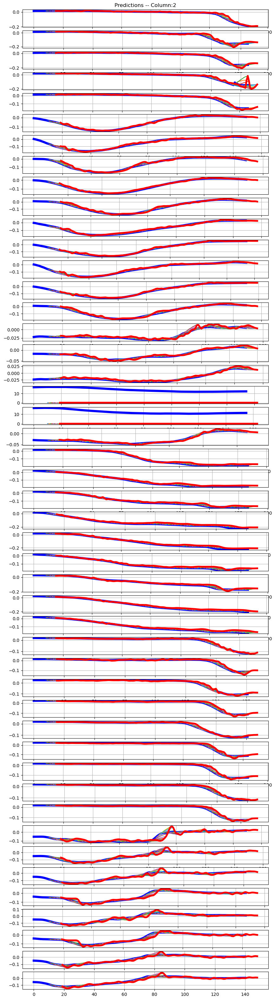

In [39]:
# plot the predictions
def plot_predictions(data, x_preds, preds):
    fig = plt.figure(figsize=(10,40))
    for i in range(0, len(data.episodes)):
        ax = fig.add_subplot(len(data.episodes), 1, i+1)
        if (i == 0):
            ax.set_title(f'Predictions -- Column:{column}')

        ax.grid(True)
        ground_truth = data.episodes[i]
        x = np.arange(len(ground_truth))
        ax.plot(x, ground_truth, "b-",linewidth=5)

        p1s = []
        x1s = []
        for j in range(0, len(x_preds[i])):
            x_p = np.arange(x_preds[i][j], x_preds[i][j] + train_periods)
            ax.plot(x_p, preds[i][j], "-",alpha=1)
            p1s += [preds[i][j][-1]]
            x1s += [x_p[-1]]
        ax.plot(x1s, p1s, '-', lw=4, color='red')

    plt.savefig('plot1', dpi=600)

plot_predictions(data_testing, x_preds, preds)

# ProMP
- p*.csv data contain the corresponding body segments positions (waist z, right hand x, right hand y, right hand z, left hand x, left hand y, left hand z) retargeted on the robot iCub.
=> column 2 = right hand y

We call the C++ code `promp.cpp`(we could have used the python interface, but it did not work well on OS-X + Conda)

Please note that we do something *very slow*: 
- at each time-step, we call the C++ code to perform the conditioning + time-scaling, which means parsing all the trajectory, computing everything (learning), etc.
- the C++ code generates a full trajectory as a csv
- we parse the .csv to get the point(s) that interests us

This could be much faster.

In [40]:
# we first need to compile the c++ code
# we are assuming that the libpromp has been installed: https://github.com/hucebot/promp
!g++  -O3 -std=c++14 -I /usr/local/include/eigen3 promp/promp.cpp  -l promp -o promp/promp


In file included from promp/promp.cpp:1:
In file included from /usr/local/include/promp/io/serializer.hpp:23:
In file included from /usr/local/include/promp/promp.hpp:25:
In file included from /usr/local/include/promp/trajectory_group.hpp:26:
/usr/local/include/promp/io/csv_reader.hpp:25:16: warning: nested namespace definition is a C++17 extension; define each namespace separately [-Wc++17-extensions]
namespace promp::io {
               ^~~~
                { namespace io
In file included from promp/promp.cpp:1:
/usr/local/include/promp/io/serializer.hpp:26:16: warning: nested namespace definition is a C++17 extension; define each namespace separately [-Wc++17-extensions]
namespace promp::io {
               ^~~~
                { namespace io
2 warnings generated.


Loading data...ok
Learning promp...ok
Infering speed of test traj...->1.00613Condititioning...# POINTS:496
ok


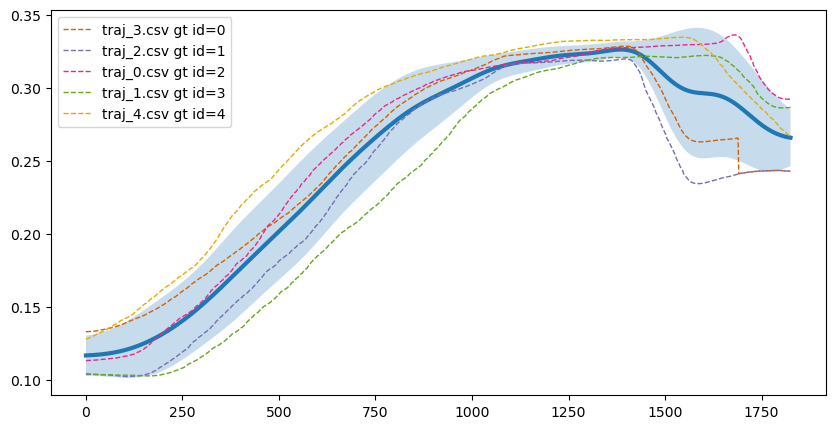

In [41]:
import subprocess

# learn a PROMP
fig = plt.figure(figsize=(10,5))
ax.set_title('rhandx', x=0.15, y=1.0, pad=-14, fontweight="bold")
ax = fig.add_subplot(1, 1, 1)

task = 'PlaceBoxTable'
dof = 1

subprocess.run("rm traj_*.csv", shell=True)

g = glob.glob(f'{data_path}/{task}/p*.csv') # wer will only keep the first half for training
training_trajs = ' '.join(g[0:int(0.5 * len(g)) + 1]) # convert to a list of string for command line

subprocess.run(f"promp/promp 500 {dof} {data_path}/{task}/p7.csv {training_trajs}", shell=True, check=True)

generated = np.loadtxt('generated.csv', delimiter=',')
variance = np.loadtxt('variance.csv', delimiter=',')
ax.fill_between(np.arange(generated.shape[0]), generated + variance, generated - variance, alpha=0.25 )
ax.plot(generated, lw=3)

# normalized trajs
g = glob.glob("traj_*.csv")
for i in range(len(g)):
    d = np.loadtxt(g[i], delimiter=' ', skiprows=3)
    ax.plot(d, '--', color=colors[i+1 % len(colors)], label=g[i] + ' gt id=' + str(i), lw='1')
_ = ax.legend()

In [42]:
import collections

# now the conditioning
tasks = [x.split('/')[-1] for x in glob.glob(f"{data_path}/*")]

dof = 1

data_promp = collections.defaultdict(list)
data_promp_mean = collections.defaultdict(list)
data_promp_var = collections.defaultdict(list)
ground_truth = collections.defaultdict(list)
for t in tasks:
    print("TASK", t)
    for g in glob.glob(f"{data_path}/{task}/p*.csv"):
        print(g, end=' | ')
        f = np.loadtxt(g, delimiter=',')
        subprocess.run(f"promp/promp {0.5 * f.shape[0]} {dof} {g} {data_path}/{t}/p*.csv" , stdout=subprocess.DEVNULL, shell=True, check=True)
        data_promp[t].append(np.loadtxt('conditioned.csv', delimiter=','))
        #data_promp_mean[t].append(np.loadtxt('modulated.csv', delimiter=','))
        #data_promp_var[t].append(np.loadtxt('variance.csv', delimiter=','))
        ground_truth[t].append(np.loadtxt(g, delimiter=','))
    print(t, "=>", len(data_promp[t]))

TASK PlaceBoxDown
AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p1.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p2.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p3.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p7.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p6.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p4.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p5.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p8.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p9.csv | PlaceBoxDown => 9
TASK BottleTable
AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p1.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p2.csv | AndyData-lab-prescientTeleopICub/datasetMultipleTasks/PlaceBoxTable/p3.csv | AndyData-lab-prescientT

100%|██████████| 9/9 [00:01<00:00,  5.74it/s]


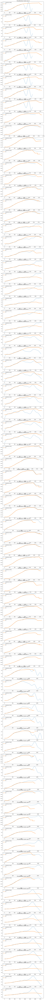

In [43]:
#total number of plots
n = sum([len(data_promp[k]) for k in data_promp.keys()])
fig = plt.figure(figsize=(10,3 * n))

dofs = ['waistz', 'rhandx', 'rhandy', 'rhandz', 'lhandx', 'lhandy', 'lhandz']
dof = 1
k = 1
for task in tqdm(data_promp.keys()): # for each task
    for i in range(len(data_promp[task])): # for each replicate
        ax = fig.add_subplot(n, 1, k)
        #ax.fill_between(np.arange(data_promp_mean[task][i][:].shape[0]), data_promp_mean[task][i][:] - data_promp_var[task][i][:], data_promp_var[task][i][:] + data_promp_mean[task][i][:], alpha=0.1, color="black" )
        #ax.plot(data_promp_mean[task][i][:], '-', lw=2, label='mean (no cond.)', alpha=0.5)

        ax.plot(data_promp[task][i][:], '--', label='prediction (50%)')
        ax.plot(ground_truth[task][i][:,dof], '-', lw=2, label='gt')

        ax.set_title(task + ' ' + dofs[dof] + " rep=" + str(i))
        ax.legend()
        k += 1

## Predict the next second (horizon)

In [44]:
!cd promp && g++  -O3 ./promp.cpp  -std=c++17 -I /usr/local/include/eigen3 -lpromp -o promp

In [45]:
def promp_prediction(horizon:int, dof:int, training : str, testing : str, skip:int) -> np.array :
    original = np.loadtxt(testing, delimiter=',') # only for length...
    pred = []
    indices = []
    for i in tqdm(range(10, original.shape[0] - horizon, skip)):
        subprocess.run(f"promp/promp {i} {dof} {testing} {training}" , shell=True, check=True, stdout=subprocess.DEVNULL)
        promp = np.loadtxt('conditioned.csv', delimiter=',')
        if i + horizon < promp.shape[0]:
            pred += [promp[i + horizon]]
        else:
            pred += [promp[-1]]
        indices += [i + horizon]
    return np.array([indices, pred]).transpose()


100%|██████████| 81/81 [02:14<00:00,  1.65s/it]


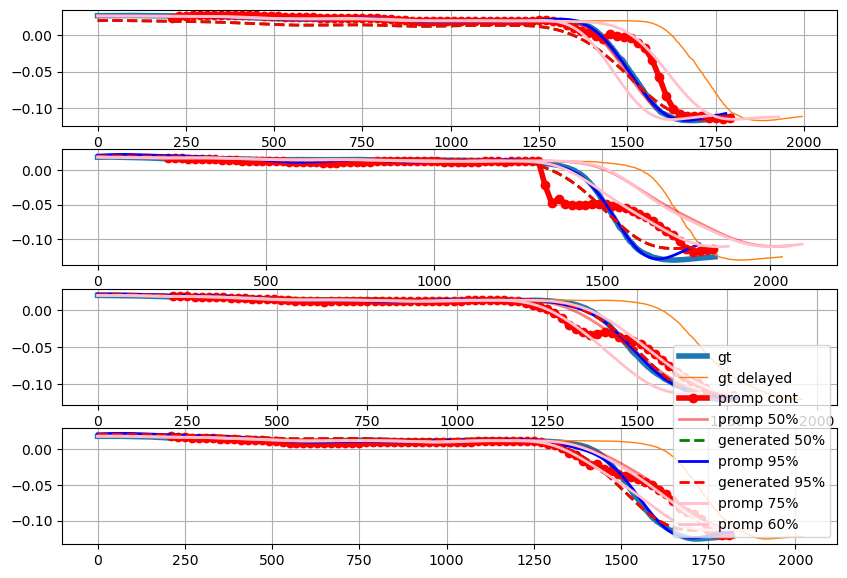

In [83]:
# plot something to check
task ='PlaceBoxHigh'
dof = 'rhandx'
dof_id = 2
horizon = 200



g = glob.glob(f'{data_path}/{task}/p*.csv') # we will only keep the first half for training
training_trajs = ' '.join(g[0:int(0.5 * len(g)) + 1]) # convert to a list of string for command line
test_trajs = g[int(0.5 * len(g)) + 1:] 

fig = plt.figure(figsize=(10,4 * len(test_trajs)))

skip = 20


# for this specific task and dof
# list is the replicates, first col is x, second col prediction
promp_preds = []

for k in range(len(test_trajs)):
    f = test_trajs[k]
    ax = fig.add_subplot(len(g), 1, k + 1)
    original = np.loadtxt(f, delimiter=',')
    ax.plot(original[:, dof_id], lw=4, label='gt')
    ax.plot(np.arange(original.shape[0]) + horizon, original[:, dof_id], lw=1, label='gt delayed')

    # now predict
    pred = promp_prediction(horizon, dof_id, training_trajs, f, skip)
    promp_preds += [pred]
    ax.plot(pred[:,0], pred[:,1] , 'o-', lw=4, label='promp cont', color='red', alpha=1.0)
    # show ProMPS at different time-steps to check that everything makes sense
    subprocess.run(f"promp/promp {0.5 * original.shape[0]} {dof_id} {f} {training_trajs}" , shell=True, check=True, stdout=subprocess.DEVNULL)
    promp = np.loadtxt('conditioned.csv', delimiter=',')
    ax.plot(promp, lw=2, label='promp 50%', color='red', alpha=0.5)
    mod = np.loadtxt('generated.csv', delimiter=',')
    ax.plot(mod, '--', lw=2, label='generated 50%', color='green', alpha=1.0)


    subprocess.run(f"promp/promp {0.95 * original.shape[0]} {dof_id} {f} {training_trajs}" , shell=True, check=True,  stdout=subprocess.DEVNULL)
    promp = np.loadtxt('conditioned.csv', delimiter=',')
    ax.plot(promp, lw=2, label='promp 95%', color='blue', alpha=1.0)
    # mod = np.loadtxt('modulated.csv', delimiter=',')
    # ax.plot(mod, '--', lw=2, label='modulated 95%', color='blue', alpha=1.0)
    mod = np.loadtxt('generated.csv', delimiter=',')
    ax.plot(mod, '--', lw=2, label='generated 95%', color='red', alpha=1.0)

    subprocess.run(f"promp/promp {0.75 * original.shape[0]} {dof_id} {f} {training_trajs}" , shell=True, check=True, stdout=subprocess.DEVNULL)
    promp = np.loadtxt('conditioned.csv', delimiter=',')
    ax.plot(promp, lw=2, label='promp 75%', color='pink', alpha=1.0)


    subprocess.run(f"promp/promp {0.6 * original.shape[0]} {dof_id} {f} {training_trajs}" , shell=True, check=True, stdout=subprocess.DEVNULL)
    promp = np.loadtxt('conditioned.csv', delimiter=',')
    ax.plot(promp, lw=2, label='promp 60%', color='pink', alpha=1.0)

    # subprocess.run(f"promp/promp {0.5 * original.shape[0]} {dof_id} {f} {p}" , shell=True, check=True, stdout=subprocess.DEVNULL)
    # promp = np.loadtxt('conditioned.csv', delimiter=',')
    # ax.plot(promp, lw=2, label='promp 50%', color='grey', alpha=1.0)

   

    ax.grid()
ax.legend()

# Comparison
## ProMP

In [47]:
horizon = 200 
skip = 200

pred_promp = collections.defaultdict(lambda : collections.defaultdict(list))

task_list = [x.split('/')[-1] for x in glob.glob(f'{data_path}/*')]
print(task_list)
for task in task_list:

    g = glob.glob(f'{data_path}/{task}/p*.csv') # we will only keep the first half for training
    training_trajs = ' '.join(g[0:int(0.5 * len(g))+1]) # convert to a list of string for command line
    testing_trajs = g[int(0.5 * len(g))+1:]
    
    for k in tqdm(range(len(testing_trajs))): # for all testing files
        f = testing_trajs[k]
        original = np.loadtxt(f, delimiter=',')
        for dof_id in range(0, original.shape[1]): # for all dofs
            # prediction
            pred = []
            r = range(horizon, original.shape[0] - horizon, skip) # we skip horizon time-steps (like LSTM)
            for i in r:
                subprocess.run(f"promp/promp {i} {dof_id} {f} {training_trajs}" , shell=True, check=True, stdout=subprocess.DEVNULL)
                promp = np.loadtxt('conditioned.csv', delimiter=',')
                t = min(i + horizon, promp.shape[0] - 1)
                pred += [promp[t]]
            pred_promp[task][dof_id] += [np.array(pred)]

['PlaceBoxDown', 'BottleTable', 'PickBoxMid', 'PickBoxLow', 'PlaceBoxTable', 'BottleBox', 'PlaceBoxSide', 'PlaceBoxHigh', 'PickBoxTable']


100%|██████████| 4/4 [01:40<00:00, 25.12s/it]


In [48]:
# ERRORS
rms_promp = collections.defaultdict(lambda : collections.defaultdict(list))
for task in task_list:
    g = glob.glob(f'{data_path}/{task}/p*.csv') # wer will only keep the first half for training
    training_trajs = ' '.join(g[0:int(0.5 * len(g))+1]) # convert to a list of string for command line
    testing_trajs = g[int(0.5 * len(g))+1:]

    for k in tqdm(range(len(testing_trajs))): # for all testing files
        original = np.loadtxt(testing_trajs[k], delimiter=',')
        for dof_id in range(0, original.shape[1]): # for all dofs
            # compute the errors
            error_pred = 0
            j = 0 
            for i in range(horizon, original.shape[0] - horizon, skip):
                p = pred_promp[task][dof_id][k][j]
                gt = original[i + horizon, dof_id]
                rms_promp[task][dof_id] += [abs(p - gt)]
                j += 1
            #print(error_pred)

100%|██████████| 4/4 [00:00<00:00, 282.46it/s]


(0.0, 0.1)

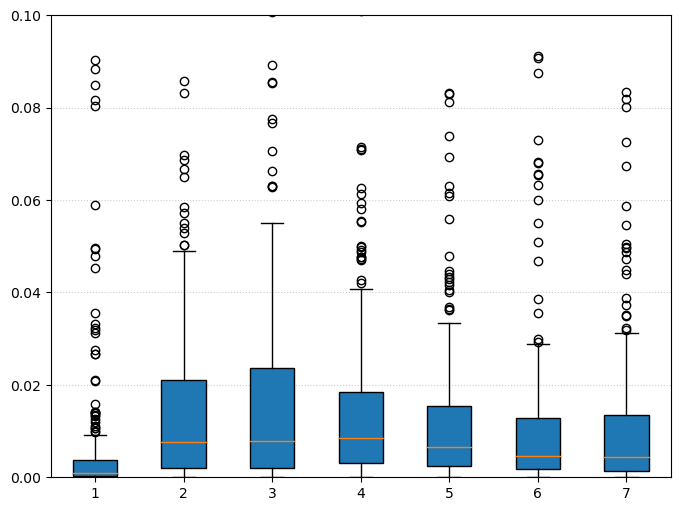

In [49]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(1,1, 1)


# rms_promp
promp = []
for i in range(len(dofs)):
    promp += [[j for t in rms_promp.keys() for j in rms_promp[t][i]]]
    
ax.grid(color='#cccccc',linestyle='dotted', axis='y')
bp1 = ax.boxplot(promp, patch_artist=True)
ax.set_ylim([0, 0.1])


## Reference (shift)

In [50]:

rms_delayed = collections.defaultdict(lambda : collections.defaultdict(list))
task_list = [x.split('/')[-1] for x in glob.glob(f'{data_path}/*')]
for task in task_list:
    g = glob.glob(f'{data_path}/{task}/p*.csv') # we will only keep the first half for training
    testing_trajs = g[int(0.5 * len(g))+1:]
    for k in tqdm(range(len(testing_trajs))): # for all testing files
        f = testing_trajs[k]
        original = np.loadtxt(f, delimiter=',')
        for dof_id in range(0, original.shape[1]): # for all dofs
            error_pred = 0
            k = 0
            for i in np.arange(original.shape[0]):
                p =  original[min(i, original.shape[0] - 1), dof_id]
                gt = original[min(i + horizon, original.shape[0] - 1), dof_id]
                rms_delayed[task][dof_id] += [abs(p - gt)]
                k += 1

100%|██████████| 4/4 [00:00<00:00, 58.75it/s]


(0.0, 0.1)

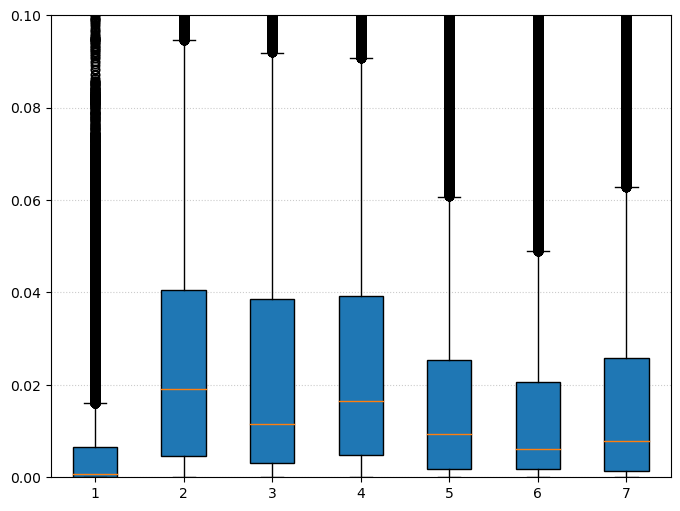

In [51]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(1,1, 1)

# rms_promp
delayed = []
for i in range(len(dofs)):
    delayed += [[j for t in rms_delayed.keys() for j in rms_delayed[t][i]]]

ax.grid(color='#cccccc',linestyle='dotted', axis='y')
bp1 = ax.boxplot(delayed, patch_artist=True)
ax.set_ylim([0, 0.1])

## LSTM

In [52]:
print("Horizon:", horizon)
skip_data = 10 # subsampling -> 100 Hz to 10Hz
train_periods = int(horizon / skip_data) # number of timesteps as input
prediction_periods = int(horizon / skip_data) # number of predicted timesteps


# some data for neural networks (complex pattern to exclude the BottleBox...)
# in the order of the columns
# first the Cartesian positions
dofs = ['waistz', 'rhandx', 'rhandy', 'rhandz', 'lhandx', 'lhandy', 'lhandz']
train_data = {}

for k in range(len(dofs)):
    train_data[k] = TrajectoryData(f'{data_path}/*/p*.csv', skip_data, k, train_periods, prediction_periods, [0, 0.5])


Horizon: 200
Dataset loaded, length: 5425
Dataset loaded, length: 5425
Dataset loaded, length: 5425
Dataset loaded, length: 5425
Dataset loaded, length: 5425
Dataset loaded, length: 5425
Dataset loaded, length: 5425


In [53]:
# train the LSTM (one LSTM for each DoF)

epochs = 100 # should be 100 for data
replicates = 10 # should be 10 for data
lstm_models = collections.defaultdict(list)
for rep in range(0, replicates):
    for k in tqdm(range(len(dofs))):
        training_set = train_data[k]
        lstm_model = LSTM(input_size=1, hidden_size=10, output_size=prediction_periods)
        lstm_models[k] += [lstm_model] # keep a pointer
        criterion = nn.MSELoss()
        optimizer = optim.Adam(lstm_model.parameters(), lr=0.001)

        lstm_model.train()
        loss_list = []
        train_loader = DataLoader(dataset=training_set, batch_size=16, shuffle=True)
        for epoch in tqdm(range(epochs+1)):
            for x,y in train_loader:#zip(x_train, y_train):
                y_hat, _ = lstm_model(x)
                loss = criterion(y_hat, y)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                loss_list += [loss.item()]   

        print("Last training loss:", loss_list[-1])
        # 206 min

 14%|█▍        | 1/7 [00:13<01:23, 13.95s/it]

Last training loss: 0.0007629935862496495


 29%|██▊       | 2/7 [00:27<01:09, 13.89s/it]

Last training loss: 0.0004551995953079313


 43%|████▎     | 3/7 [00:41<00:55, 13.91s/it]

Last training loss: 0.004272485617548227


 57%|█████▋    | 4/7 [00:56<00:42, 14.29s/it]

Last training loss: 0.0005143177695572376


 71%|███████▏  | 5/7 [01:10<00:28, 14.30s/it]

Last training loss: 0.00416543846949935


 86%|████████▌ | 6/7 [01:25<00:14, 14.45s/it]

Last training loss: 0.021368753165006638


100%|██████████| 7/7 [01:40<00:00, 14.36s/it]

Last training loss: 0.06654118746519089


In [54]:
test_data = {}
for k in range(len(dofs)):
    test_data[k] = TrajectoryData(f'{data_path}/*/p*.csv', skip_data, k, train_periods, prediction_periods, [0.5, 1.0], scaler=train_data[k].scaler) 

# LSTM errors
lstm_errors = collections.defaultdict(list)

for k in range(len(dofs)):
    test_set = test_data[k]
    n = 0
    error = 0
    for t in tqdm(range(len(test_set))):
        for model in lstm_models[k]:
            with torch.no_grad():
                input_vec = torch.Tensor(test_set.x[t]).view(1, -1)
                predictions, _ = model(input_vec)
                predictions = test_set.scaler.inverse_transform(np.array(predictions.reshape(-1,1)))
                expected = test_set.scaler.inverse_transform(test_set.y[t].view(-1, 1))
                lstm_errors[k] += [abs(predictions[-1].item() - expected[-1].item())]
                n += 1


Dataset loaded, length: 5898
Dataset loaded, length: 5898
Dataset loaded, length: 5898
Dataset loaded, length: 5898
Dataset loaded, length: 5898
Dataset loaded, length: 5898
Dataset loaded, length: 5898


100%|██████████| 5898/5898 [00:03<00:00, 1616.63it/s]


(0.0, 0.1)

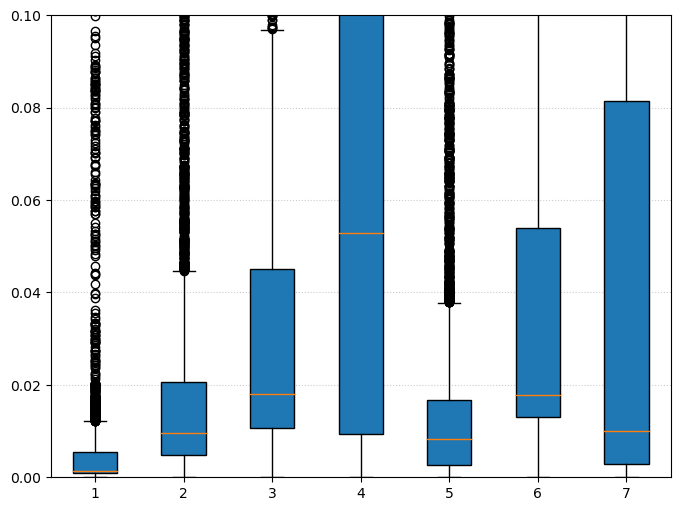

In [55]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(1,1, 1)

lstm_errors_plot = [lstm_errors[k] for k in range(0, len(lstm_errors.keys()))]
ax.grid(color='#cccccc',linestyle='dotted', axis='y')
bp1 = ax.boxplot(lstm_errors_plot, patch_artist=True)
ax.set_ylim([0, 0.1])

In [56]:
# function to compute the predictions of LSTM
# horizon is fixed at training
# we use test_files to be close to the promp predictor
# we need the right scaler
# array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample
def model_prediction(model, scaler, test_file:str, dof, skip_data):
    model.eval()
    original = np.loadtxt(test_file, delimiter=',')[::skip_data, dof].reshape(-1, 1)
    original_scaled = scaler.transform(original)
    all_preds = []
    indices = []     
    # for all episodes (replications of the task)
    for i in tqdm(range(train_periods, original_scaled.shape[0])):
        preds = []
        with torch.no_grad():
            input_vector = torch.Tensor(original_scaled[i-train_periods:i].reshape(1, -1))
            predictions, _ = model(input_vector)
            predictions = scaler.inverse_transform(np.array(predictions.reshape(-1,1)))
            #predictions = predictions.reshape(-1, 1)
            preds += [predictions[-1].item()]
            indices += [(i + train_periods) * skip_data]
        all_preds += [preds]
    return np.array(all_preds), np.array(indices)



100%|██████████| 125/125 [00:00<00:00, 2112.59it/s]


200


100%|██████████| 95/95 [01:13<00:00,  1.29it/s]


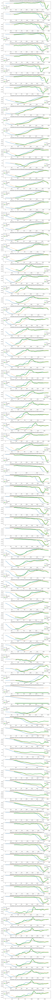

In [57]:
# plot to check
dof = 2
g = glob.glob(f"{data_path}/*/p*.csv")
preds = []
for i in range(len(g)):
    preds += [model_prediction(lstm_models[dof][0], train_data[dof].scaler, g[i], dof, skip_data)]

fig = plt.figure(figsize=(10,2 * len(g)))
print(train_periods * skip_data)
for k in tqdm(range(len(g))):
    f = g[k]
    ax = fig.add_subplot(len(g), 1, k + 1)
    original = np.loadtxt(f, delimiter=',')[:,dof]
    original = np.loadtxt(f, delimiter=',')[:, dof].reshape(-1, 1)
    p, indices = preds[k]
    ax.plot(np.arange(original.shape[0]), original, lw=2, label='gt')
    ax.plot(np.arange(original.shape[0]) + train_periods * skip_data, original, '--', lw=2, label='gt shifted')
    ax.set_title(f)

    ax.plot(indices, p, lw=4, label='pred')
    ax.legend()
    fig.tight_layout()

## Comparison of predictions

In [58]:



def prediction_task(task:str):
    n_dofs = np.loadtxt(glob.glob(f'{data_path}/{task}/p*.csv')[0], delimiter=',').shape[1]

    pred_promp = collections.defaultdict(list)
    pred_lstm = collections.defaultdict(list)

    g = glob.glob(f'{data_path}/{task}/p*.csv') # we will only keep the first half for training
    training_trajs = ' '.join(g[0:int(0.5 * len(g)) + 1]) # convert to a list of string for command line
    testing_trajs = g[int(0.5 * len(g)) + 1:]
    gt =  collections.defaultdict(list)

    for dof in range(0, n_dofs):
        print(f"Task: {task} / DOF {dof}...")
        for i in tqdm(range(len(testing_trajs))):
            print(f"{i}/{len(testing_trajs)}")
            p_l = []
            for j in range(len(lstm_models[dof])):
                p_l += [model_prediction(lstm_models[dof][j], train_data[dof].scaler, testing_trajs[i], dof, skip_data)]
            pred_lstm[dof] += [p_l]
            pred_promp[dof] += [promp_prediction(horizon, dof, training_trajs, testing_trajs[i], 20)]
            gt[dof] += [np.loadtxt(testing_trajs[i], delimiter=',')[:,dof]]
    return pred_promp, pred_lstm, gt


In [59]:
task_list = [x.split('/')[-1] for x in glob.glob(f'{data_path}/*')]
print(task_list)

all_preds_promp = {}
all_preds_lstm = {}
gt = {}


task = 'PlaceBoxDown'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)


['PlaceBoxDown', 'BottleTable', 'PickBoxMid', 'PickBoxLow', 'PlaceBoxTable', 'BottleBox', 'PlaceBoxSide', 'PlaceBoxHigh', 'PickBoxTable']
Task: PlaceBoxDown / DOF 0...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:53<02:40, 53.48s/it]

1/4


 50%|█████     | 2/4 [01:42<01:41, 50.77s/it]

2/4


 75%|███████▌  | 3/4 [02:35<00:51, 51.74s/it]

3/4


100%|██████████| 4/4 [03:25<00:00, 51.25s/it]


Task: PlaceBoxDown / DOF 1...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:49<02:29, 49.67s/it]

1/4


 50%|█████     | 2/4 [01:37<01:36, 48.42s/it]

2/4


 75%|███████▌  | 3/4 [02:30<00:50, 50.57s/it]

3/4


100%|██████████| 4/4 [03:22<00:00, 50.58s/it]


Task: PlaceBoxDown / DOF 2...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:48<02:25, 48.54s/it]

1/4


 50%|█████     | 2/4 [01:37<01:37, 48.92s/it]

2/4


 75%|███████▌  | 3/4 [02:35<00:53, 53.04s/it]

3/4


100%|██████████| 4/4 [03:35<00:00, 53.81s/it]


Task: PlaceBoxDown / DOF 3...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:57<02:52, 57.59s/it]

1/4


 50%|█████     | 2/4 [01:53<01:52, 56.48s/it]

2/4


 75%|███████▌  | 3/4 [02:52<00:57, 57.84s/it]

3/4


100%|██████████| 4/4 [03:49<00:00, 57.38s/it]


Task: PlaceBoxDown / DOF 4...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:55<02:46, 55.64s/it]

1/4


 50%|█████     | 2/4 [01:49<01:48, 54.44s/it]

2/4


 75%|███████▌  | 3/4 [02:48<00:56, 56.60s/it]

3/4


100%|██████████| 4/4 [03:44<00:00, 56.17s/it]


Task: PlaceBoxDown / DOF 5...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:55<02:46, 55.42s/it]

1/4


 50%|█████     | 2/4 [01:48<01:47, 53.91s/it]

2/4


 75%|███████▌  | 3/4 [02:45<00:55, 55.54s/it]

3/4


100%|██████████| 4/4 [03:40<00:00, 55.15s/it]


Task: PlaceBoxDown / DOF 6...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:53<02:40, 53.64s/it]

1/4


 50%|█████     | 2/4 [01:46<01:46, 53.11s/it]

2/4


 75%|███████▌  | 3/4 [02:43<00:54, 54.83s/it]

3/4


100%|██████████| 4/4 [03:38<00:00, 54.51s/it]


In [60]:
def plot_prediction(task, preds_promp, preds_lstm):
    g = glob.glob(f'{data_path}/{task}/p*.csv')
    g = g[int(0.5 * len(g))+1:] # get the testing only
    fig = plt.figure(figsize=(4 * 7, 2 * len(g)))
    n = 0
    for k in tqdm(range(len(g))): # for each replication of the task
        f = g[k]
        original = np.loadtxt(f, delimiter=',')
        for dof in range(0, original.shape[1]): # for each degree of freedom
            gt = original[:, dof].reshape(-1, 1)
            ax = fig.add_subplot(len(preds_promp[0]), original.shape[1], n + 1)
            n += 1
            # GT
            ax.plot(np.arange(gt.shape[0]), gt, lw=4, label='Ground truth', color='blue')
            ax.plot(np.arange(gt.shape[0]) + train_periods * skip_data, gt, '--', lw=2, label='Delayed', color='blue')
            
            # LSTM
            for i in range(len(preds_lstm[dof][k])): # for each replicate of the LSTM
                p, indices = preds_lstm[dof][k][i]
                if (i == 0):
                    ax.plot(indices, p, lw=2, label='LSTM', alpha=0.5, color='orange')
                else:
                    ax.plot(indices, p, lw=2, alpha=0.5, color='orange')

            # ProMP
            p = preds_promp[dof][k]
            ax.plot(p[:,0], p[:,1], lw=2, label='ProMP', color='red')

            # tuning
            #ax.set_title(f)
            #ax.legend()
            ax.grid(axis='y', color="0.9", linestyle='-', linewidth=1)
            ax.set_xlim((0, original.shape[0]))
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.spines['left'].set_visible(False)
            ax.spines['bottom'].set_linewidth(2)

    fig.tight_layout()
    fig.savefig(f'promp_lstm_{task}_{horizon}.pdf')

PlaceBoxDown


100%|██████████| 4/4 [00:00<00:00, 10.07it/s]


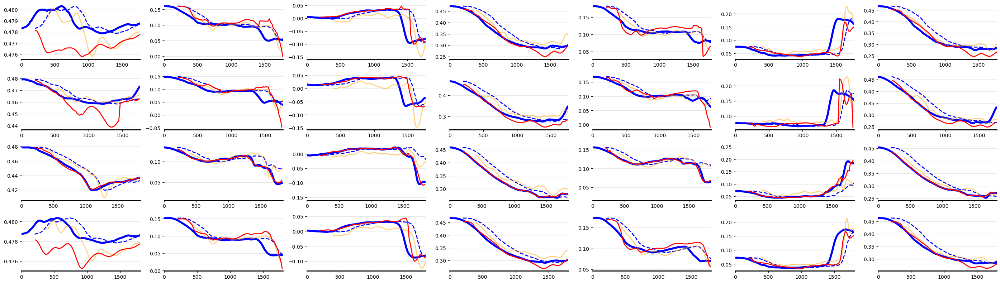

In [61]:
print(task)
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [62]:
# ['PlaceBoxDown', 'BottleTable', 'PickBoxMid', 'PickBoxLow', 'PlaceBoxTable', 'BottleBox', 'PlaceBoxSide', 'PlaceBoxHigh', 'PickBoxTable']
task = 'BottleTable'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

Task: BottleTable / DOF 0...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:45<04:30, 45.03s/it]

1/7


 29%|██▊       | 2/7 [01:28<03:40, 44.00s/it]

2/7


 43%|████▎     | 3/7 [02:15<03:02, 45.55s/it]

3/7


 57%|█████▋    | 4/7 [02:59<02:14, 44.82s/it]

4/7


 71%|███████▏  | 5/7 [03:44<01:29, 44.78s/it]

5/7


 86%|████████▌ | 6/7 [04:24<00:43, 43.36s/it]

6/7


100%|██████████| 7/7 [05:07<00:00, 43.87s/it]


Task: BottleTable / DOF 1...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:43<04:20, 43.42s/it]

1/7


 29%|██▊       | 2/7 [01:27<03:38, 43.64s/it]

2/7


 43%|████▎     | 3/7 [02:11<02:56, 44.14s/it]

3/7


 57%|█████▋    | 4/7 [02:57<02:13, 44.55s/it]

4/7


 71%|███████▏  | 5/7 [03:42<01:30, 45.01s/it]

5/7


 86%|████████▌ | 6/7 [04:25<00:44, 44.10s/it]

6/7


100%|██████████| 7/7 [05:09<00:00, 44.16s/it]


Task: BottleTable / DOF 2...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:43<04:20, 43.40s/it]

1/7


 29%|██▊       | 2/7 [01:27<03:38, 43.70s/it]

2/7


 43%|████▎     | 3/7 [02:11<02:55, 44.00s/it]

3/7


 57%|█████▋    | 4/7 [02:57<02:14, 44.70s/it]

4/7


 71%|███████▏  | 5/7 [03:43<01:30, 45.36s/it]

5/7


 86%|████████▌ | 6/7 [04:25<00:44, 44.21s/it]

6/7


100%|██████████| 7/7 [05:09<00:00, 44.28s/it]


Task: BottleTable / DOF 3...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:42<04:13, 42.29s/it]

1/7


 29%|██▊       | 2/7 [01:26<03:35, 43.19s/it]

2/7


 43%|████▎     | 3/7 [02:10<02:55, 43.87s/it]

3/7


 57%|█████▋    | 4/7 [02:58<02:15, 45.28s/it]

4/7


 71%|███████▏  | 5/7 [03:42<01:29, 44.95s/it]

5/7


 86%|████████▌ | 6/7 [04:24<00:43, 43.92s/it]

6/7


100%|██████████| 7/7 [05:08<00:00, 44.03s/it]


Task: BottleTable / DOF 4...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:44<04:24, 44.14s/it]

1/7


 29%|██▊       | 2/7 [01:27<03:39, 43.80s/it]

2/7


 43%|████▎     | 3/7 [02:12<02:56, 44.24s/it]

3/7


 57%|█████▋    | 4/7 [02:57<02:13, 44.46s/it]

4/7


 71%|███████▏  | 5/7 [03:41<01:29, 44.52s/it]

5/7


 86%|████████▌ | 6/7 [04:23<00:43, 43.51s/it]

6/7


100%|██████████| 7/7 [05:06<00:00, 43.83s/it]


Task: BottleTable / DOF 5...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:44<04:25, 44.21s/it]

1/7


 29%|██▊       | 2/7 [01:27<03:37, 43.56s/it]

2/7


 43%|████▎     | 3/7 [02:12<02:57, 44.33s/it]

3/7


 57%|█████▋    | 4/7 [02:58<02:14, 44.81s/it]

4/7


 71%|███████▏  | 5/7 [03:44<01:30, 45.28s/it]

5/7


 86%|████████▌ | 6/7 [04:24<00:43, 43.70s/it]

6/7


100%|██████████| 7/7 [05:08<00:00, 44.02s/it]


Task: BottleTable / DOF 6...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:42<04:13, 42.21s/it]

1/7


 29%|██▊       | 2/7 [01:25<03:33, 42.76s/it]

2/7


 43%|████▎     | 3/7 [02:12<02:58, 44.58s/it]

3/7


 57%|█████▋    | 4/7 [02:55<02:12, 44.16s/it]

4/7


 71%|███████▏  | 5/7 [03:42<01:30, 45.12s/it]

5/7


 86%|████████▌ | 6/7 [04:23<00:43, 43.87s/it]

6/7


100%|██████████| 7/7 [05:07<00:00, 43.91s/it]


100%|██████████| 7/7 [00:00<00:00,  8.32it/s]


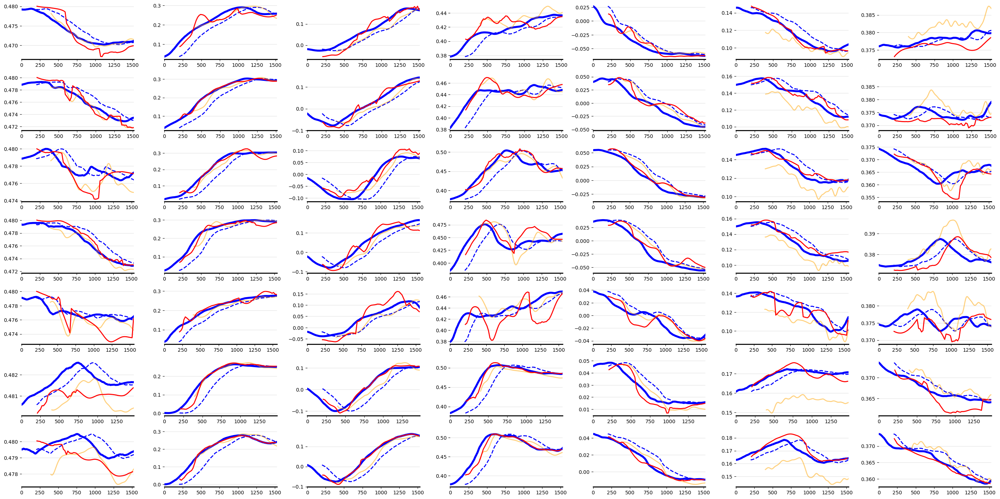

In [63]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [64]:
task = 'PickBoxMid'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

Task: PickBoxMid / DOF 0...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:34<01:42, 34.07s/it]

1/4


 50%|█████     | 2/4 [01:07<01:07, 33.65s/it]

2/4


 75%|███████▌  | 3/4 [01:43<00:34, 34.61s/it]

3/4


100%|██████████| 4/4 [02:17<00:00, 34.42s/it]


Task: PickBoxMid / DOF 1...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:33<01:41, 33.85s/it]

1/4


 50%|█████     | 2/4 [01:08<01:08, 34.15s/it]

2/4


 75%|███████▌  | 3/4 [01:43<00:34, 34.72s/it]

3/4


100%|██████████| 4/4 [02:17<00:00, 34.36s/it]


Task: PickBoxMid / DOF 2...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:34<01:42, 34.03s/it]

1/4


 50%|█████     | 2/4 [01:09<01:09, 34.60s/it]

2/4


 75%|███████▌  | 3/4 [01:44<00:35, 35.08s/it]

3/4


100%|██████████| 4/4 [02:19<00:00, 34.80s/it]


Task: PickBoxMid / DOF 3...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:34<01:42, 34.02s/it]

1/4


 50%|█████     | 2/4 [01:08<01:08, 34.47s/it]

2/4


 75%|███████▌  | 3/4 [01:43<00:34, 34.73s/it]

3/4


100%|██████████| 4/4 [02:17<00:00, 34.50s/it]


Task: PickBoxMid / DOF 4...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:34<01:42, 34.08s/it]

1/4


 50%|█████     | 2/4 [01:08<01:08, 34.50s/it]

2/4


 75%|███████▌  | 3/4 [01:44<00:34, 34.98s/it]

3/4


100%|██████████| 4/4 [02:18<00:00, 34.66s/it]


Task: PickBoxMid / DOF 5...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:34<01:44, 34.90s/it]

1/4


 50%|█████     | 2/4 [01:09<01:09, 34.69s/it]

2/4


 75%|███████▌  | 3/4 [01:45<00:35, 35.21s/it]

3/4


100%|██████████| 4/4 [02:19<00:00, 34.82s/it]


Task: PickBoxMid / DOF 6...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:33<01:41, 33.81s/it]

1/4


 50%|█████     | 2/4 [01:08<01:08, 34.30s/it]

2/4


 75%|███████▌  | 3/4 [01:43<00:34, 34.56s/it]

3/4


100%|██████████| 4/4 [02:17<00:00, 34.26s/it]


100%|██████████| 4/4 [00:00<00:00,  6.27it/s]


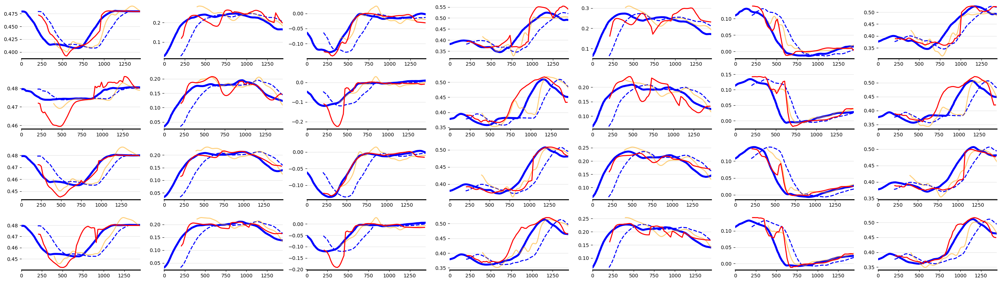

In [65]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [66]:
task = 'PickBoxLow'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

Task: PickBoxLow / DOF 0...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:35<01:47, 35.86s/it]

1/4


 50%|█████     | 2/4 [01:10<01:09, 34.87s/it]

2/4


 75%|███████▌  | 3/4 [01:42<00:33, 33.57s/it]

3/4


100%|██████████| 4/4 [02:17<00:00, 34.45s/it]


Task: PickBoxLow / DOF 1...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:35<01:45, 35.26s/it]

1/4


 50%|█████     | 2/4 [01:09<01:09, 34.61s/it]

2/4


 75%|███████▌  | 3/4 [01:41<00:33, 33.32s/it]

3/4


100%|██████████| 4/4 [02:16<00:00, 34.09s/it]


Task: PickBoxLow / DOF 2...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:37<01:51, 37.33s/it]

1/4


 50%|█████     | 2/4 [01:10<01:10, 35.01s/it]

2/4


 75%|███████▌  | 3/4 [01:43<00:33, 33.89s/it]

3/4


100%|██████████| 4/4 [02:18<00:00, 34.68s/it]


Task: PickBoxLow / DOF 3...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:36<01:49, 36.35s/it]

1/4


 50%|█████     | 2/4 [01:10<01:10, 35.05s/it]

2/4


 75%|███████▌  | 3/4 [01:42<00:33, 33.76s/it]

3/4


100%|██████████| 4/4 [02:17<00:00, 34.48s/it]


Task: PickBoxLow / DOF 4...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:35<01:45, 35.20s/it]

1/4


 50%|█████     | 2/4 [01:09<01:09, 34.54s/it]

2/4


 75%|███████▌  | 3/4 [01:41<00:33, 33.33s/it]

3/4


100%|██████████| 4/4 [02:16<00:00, 34.08s/it]


Task: PickBoxLow / DOF 5...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:37<01:52, 37.46s/it]

1/4


 50%|█████     | 2/4 [01:10<01:09, 34.92s/it]

2/4


 75%|███████▌  | 3/4 [01:43<00:33, 33.88s/it]

3/4


100%|██████████| 4/4 [02:18<00:00, 34.65s/it]


Task: PickBoxLow / DOF 6...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:36<01:48, 36.19s/it]

1/4


 50%|█████     | 2/4 [01:09<01:09, 34.78s/it]

2/4


 75%|███████▌  | 3/4 [01:42<00:33, 33.57s/it]

3/4


100%|██████████| 4/4 [02:17<00:00, 34.36s/it]


100%|██████████| 4/4 [00:00<00:00, 11.26it/s]


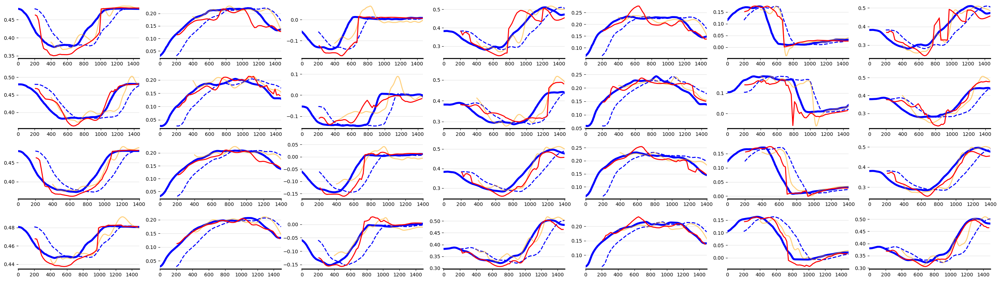

In [67]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [68]:
task = 'PlaceBoxTable'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

Task: PlaceBoxTable / DOF 0...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:53<02:41, 53.96s/it]

1/4


 50%|█████     | 2/4 [01:52<01:53, 56.66s/it]

2/4


 75%|███████▌  | 3/4 [02:46<00:55, 55.64s/it]

3/4


100%|██████████| 4/4 [03:43<00:00, 55.79s/it]


Task: PlaceBoxTable / DOF 1...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:55<02:47, 55.95s/it]

1/4


 50%|█████     | 2/4 [01:51<01:51, 55.98s/it]

2/4


 75%|███████▌  | 3/4 [02:48<00:56, 56.27s/it]

3/4


100%|██████████| 4/4 [03:44<00:00, 56.02s/it]


Task: PlaceBoxTable / DOF 2...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:56<02:48, 56.29s/it]

1/4


 50%|█████     | 2/4 [01:52<01:51, 55.96s/it]

2/4


 75%|███████▌  | 3/4 [02:47<00:55, 55.84s/it]

3/4


100%|██████████| 4/4 [03:42<00:00, 55.59s/it]


Task: PlaceBoxTable / DOF 3...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:53<02:41, 53.90s/it]

1/4


 50%|█████     | 2/4 [01:49<01:50, 55.17s/it]

2/4


 75%|███████▌  | 3/4 [02:43<00:54, 54.52s/it]

3/4


100%|██████████| 4/4 [03:37<00:00, 54.39s/it]


Task: PlaceBoxTable / DOF 4...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:56<02:49, 56.65s/it]

1/4


 50%|█████     | 2/4 [01:52<01:52, 56.29s/it]

2/4


 75%|███████▌  | 3/4 [02:49<00:56, 56.43s/it]

3/4


100%|██████████| 4/4 [03:45<00:00, 56.40s/it]


Task: PlaceBoxTable / DOF 5...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:59<02:59, 59.78s/it]

1/4


 50%|█████     | 2/4 [01:58<01:58, 59.15s/it]

2/4


 75%|███████▌  | 3/4 [02:55<00:58, 58.22s/it]

3/4


100%|██████████| 4/4 [03:51<00:00, 57.83s/it]


Task: PlaceBoxTable / DOF 6...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:54<02:42, 54.28s/it]

1/4


 50%|█████     | 2/4 [01:52<01:53, 56.66s/it]

2/4


 75%|███████▌  | 3/4 [02:49<00:56, 56.60s/it]

3/4


100%|██████████| 4/4 [03:44<00:00, 56.04s/it]


100%|██████████| 4/4 [00:00<00:00,  5.96it/s]


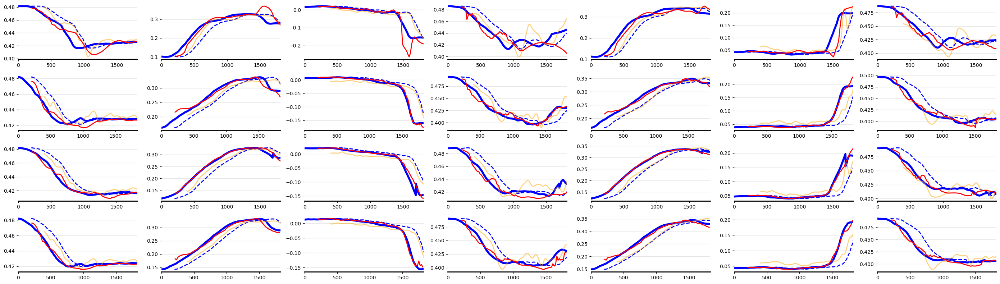

In [69]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [70]:


task = 'PlaceBoxTable'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

Task: PlaceBoxTable / DOF 0...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:57<02:51, 57.23s/it]

1/4


 50%|█████     | 2/4 [01:58<01:59, 59.70s/it]

2/4


 75%|███████▌  | 3/4 [02:57<00:59, 59.34s/it]

3/4


100%|██████████| 4/4 [03:56<00:00, 59.13s/it]


Task: PlaceBoxTable / DOF 1...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:58<02:54, 58.23s/it]

1/4


 50%|█████     | 2/4 [01:56<01:56, 58.02s/it]

2/4


 75%|███████▌  | 3/4 [02:56<00:59, 59.22s/it]

3/4


100%|██████████| 4/4 [03:54<00:00, 58.59s/it]


Task: PlaceBoxTable / DOF 2...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:59<02:59, 59.74s/it]

1/4


 50%|█████     | 2/4 [01:57<01:57, 58.65s/it]

2/4


 75%|███████▌  | 3/4 [02:55<00:58, 58.21s/it]

3/4


100%|██████████| 4/4 [03:54<00:00, 58.62s/it]


Task: PlaceBoxTable / DOF 3...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:54<02:44, 54.79s/it]

1/4


 50%|█████     | 2/4 [01:52<01:52, 56.36s/it]

2/4


 75%|███████▌  | 3/4 [02:47<00:55, 55.97s/it]

3/4


100%|██████████| 4/4 [03:43<00:00, 55.81s/it]


Task: PlaceBoxTable / DOF 4...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:59<02:59, 59.99s/it]

1/4


 50%|█████     | 2/4 [01:54<01:53, 56.55s/it]

2/4


 75%|███████▌  | 3/4 [02:46<00:54, 54.77s/it]

3/4


100%|██████████| 4/4 [03:38<00:00, 54.65s/it]


Task: PlaceBoxTable / DOF 5...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:52<02:38, 52.67s/it]

1/4


 50%|█████     | 2/4 [01:45<01:45, 52.72s/it]

2/4


 75%|███████▌  | 3/4 [02:38<00:52, 52.67s/it]

3/4


100%|██████████| 4/4 [03:29<00:00, 52.43s/it]


Task: PlaceBoxTable / DOF 6...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:50<02:31, 50.43s/it]

1/4


 50%|█████     | 2/4 [01:42<01:42, 51.50s/it]

2/4


 75%|███████▌  | 3/4 [02:32<00:50, 50.96s/it]

3/4


100%|██████████| 4/4 [03:23<00:00, 50.87s/it]


100%|██████████| 4/4 [00:00<00:00,  9.23it/s]


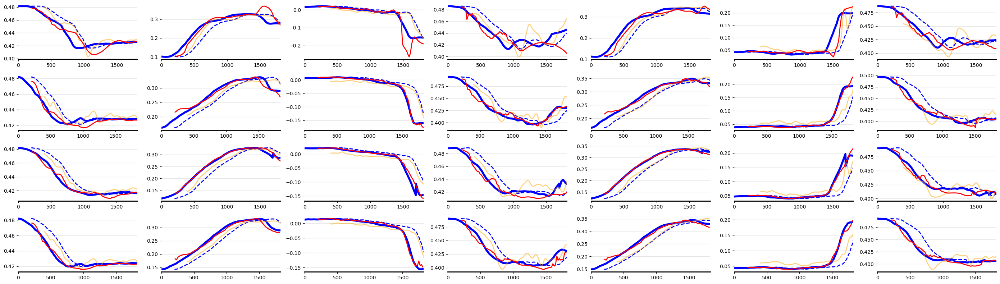

In [71]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [72]:
task = 'BottleBox'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

Task: BottleBox / DOF 0...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:39<03:58, 39.75s/it]

1/7


 29%|██▊       | 2/7 [01:17<03:13, 38.77s/it]

2/7


 43%|████▎     | 3/7 [01:57<02:36, 39.19s/it]

3/7


 57%|█████▋    | 4/7 [02:35<01:56, 38.78s/it]

4/7


 71%|███████▏  | 5/7 [03:17<01:19, 39.82s/it]

5/7


 86%|████████▌ | 6/7 [04:00<00:40, 40.84s/it]

6/7


100%|██████████| 7/7 [04:43<00:00, 40.55s/it]


Task: BottleBox / DOF 1...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:39<03:55, 39.17s/it]

1/7


 29%|██▊       | 2/7 [01:17<03:14, 38.96s/it]

2/7


 43%|████▎     | 3/7 [01:59<02:40, 40.18s/it]

3/7


 57%|█████▋    | 4/7 [02:39<01:59, 39.88s/it]

4/7


 71%|███████▏  | 5/7 [03:21<01:21, 40.68s/it]

5/7


 86%|████████▌ | 6/7 [04:03<00:41, 41.35s/it]

6/7


100%|██████████| 7/7 [04:47<00:00, 41.11s/it]


Task: BottleBox / DOF 2...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:39<03:54, 39.09s/it]

1/7


 29%|██▊       | 2/7 [01:17<03:14, 38.94s/it]

2/7


 43%|████▎     | 3/7 [01:57<02:37, 39.40s/it]

3/7


 57%|█████▋    | 4/7 [02:36<01:56, 38.93s/it]

4/7


 71%|███████▏  | 5/7 [03:16<01:19, 39.58s/it]

5/7


 86%|████████▌ | 6/7 [03:59<00:40, 40.52s/it]

6/7


100%|██████████| 7/7 [04:42<00:00, 40.30s/it]


Task: BottleBox / DOF 3...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:38<03:53, 38.98s/it]

1/7


 29%|██▊       | 2/7 [01:17<03:13, 38.64s/it]

2/7


 43%|████▎     | 3/7 [01:57<02:37, 39.41s/it]

3/7


 57%|█████▋    | 4/7 [02:35<01:56, 38.85s/it]

4/7


 71%|███████▏  | 5/7 [03:17<01:19, 39.90s/it]

5/7


 86%|████████▌ | 6/7 [04:00<00:40, 40.98s/it]

6/7


100%|██████████| 7/7 [04:42<00:00, 40.41s/it]


Task: BottleBox / DOF 4...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:39<03:54, 39.15s/it]

1/7


 29%|██▊       | 2/7 [01:17<03:12, 38.46s/it]

2/7


 43%|████▎     | 3/7 [01:56<02:35, 38.94s/it]

3/7


 57%|█████▋    | 4/7 [02:34<01:55, 38.66s/it]

4/7


 71%|███████▏  | 5/7 [03:15<01:18, 39.48s/it]

5/7


 86%|████████▌ | 6/7 [03:57<00:40, 40.32s/it]

6/7


100%|██████████| 7/7 [04:40<00:00, 40.05s/it]


Task: BottleBox / DOF 5...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:39<03:56, 39.39s/it]

1/7


 29%|██▊       | 2/7 [01:17<03:12, 38.56s/it]

2/7


 43%|████▎     | 3/7 [01:57<02:37, 39.40s/it]

3/7


 57%|█████▋    | 4/7 [02:36<01:57, 39.00s/it]

4/7


 71%|███████▏  | 5/7 [03:17<01:20, 40.01s/it]

5/7


 86%|████████▌ | 6/7 [04:00<00:40, 41.00s/it]

6/7


100%|██████████| 7/7 [04:43<00:00, 40.52s/it]


Task: BottleBox / DOF 6...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:38<03:53, 38.91s/it]

1/7


 29%|██▊       | 2/7 [01:17<03:14, 38.90s/it]

2/7


 43%|████▎     | 3/7 [01:58<02:39, 39.84s/it]

3/7


 57%|█████▋    | 4/7 [02:37<01:58, 39.53s/it]

4/7


 71%|███████▏  | 5/7 [03:19<01:20, 40.48s/it]

5/7


 86%|████████▌ | 6/7 [04:03<00:41, 41.53s/it]

6/7


100%|██████████| 7/7 [04:47<00:00, 41.10s/it]


In [73]:
print(task_list)
print(all_preds_promp.keys())
task = 'BottleBox'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

['PlaceBoxDown', 'BottleTable', 'PickBoxMid', 'PickBoxLow', 'PlaceBoxTable', 'BottleBox', 'PlaceBoxSide', 'PlaceBoxHigh', 'PickBoxTable']
dict_keys(['PlaceBoxDown', 'BottleTable', 'PickBoxMid', 'PickBoxLow', 'PlaceBoxTable', 'BottleBox'])
Task: BottleBox / DOF 0...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:40<04:00, 40.01s/it]

1/7


 29%|██▊       | 2/7 [01:18<03:14, 38.91s/it]

2/7


 43%|████▎     | 3/7 [01:57<02:37, 39.31s/it]

3/7


 57%|█████▋    | 4/7 [02:36<01:56, 38.96s/it]

4/7


 71%|███████▏  | 5/7 [03:18<01:19, 39.98s/it]

5/7


 86%|████████▌ | 6/7 [04:01<00:41, 41.03s/it]

6/7


100%|██████████| 7/7 [04:44<00:00, 40.70s/it]


Task: BottleBox / DOF 1...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:39<03:55, 39.28s/it]

1/7


 29%|██▊       | 2/7 [01:18<03:15, 39.05s/it]

2/7


 43%|████▎     | 3/7 [01:59<02:40, 40.13s/it]

3/7


 57%|█████▋    | 4/7 [02:38<01:59, 39.71s/it]

4/7


 71%|███████▏  | 5/7 [03:21<01:21, 40.87s/it]

5/7


 86%|████████▌ | 6/7 [04:05<00:41, 41.94s/it]

6/7


100%|██████████| 7/7 [04:50<00:00, 41.57s/it]


Task: BottleBox / DOF 2...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:40<04:00, 40.02s/it]

1/7


 29%|██▊       | 2/7 [01:18<03:16, 39.39s/it]

2/7


 43%|████▎     | 3/7 [01:59<02:39, 39.96s/it]

3/7


 57%|█████▋    | 4/7 [02:37<01:57, 39.27s/it]

4/7


 71%|███████▏  | 5/7 [03:18<01:19, 39.67s/it]

5/7


 86%|████████▌ | 6/7 [04:00<00:40, 40.67s/it]

6/7


100%|██████████| 7/7 [04:43<00:00, 40.47s/it]


Task: BottleBox / DOF 3...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:38<03:52, 38.76s/it]

1/7


 29%|██▊       | 2/7 [01:16<03:12, 38.41s/it]

2/7


 43%|████▎     | 3/7 [01:57<02:36, 39.19s/it]

3/7


 57%|█████▋    | 4/7 [02:35<01:56, 38.72s/it]

4/7


 71%|███████▏  | 5/7 [03:17<01:19, 39.92s/it]

5/7


 86%|████████▌ | 6/7 [03:59<00:40, 40.90s/it]

6/7


100%|██████████| 7/7 [04:42<00:00, 40.37s/it]


Task: BottleBox / DOF 4...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:38<03:53, 38.95s/it]

1/7


 29%|██▊       | 2/7 [01:17<03:13, 38.62s/it]

2/7


 43%|████▎     | 3/7 [01:56<02:36, 39.02s/it]

3/7


 57%|█████▋    | 4/7 [02:34<01:55, 38.65s/it]

4/7


 71%|███████▏  | 5/7 [03:15<01:18, 39.38s/it]

5/7


 86%|████████▌ | 6/7 [03:56<00:40, 40.03s/it]

6/7


100%|██████████| 7/7 [04:39<00:00, 39.94s/it]


Task: BottleBox / DOF 5...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:39<03:55, 39.33s/it]

1/7


 29%|██▊       | 2/7 [01:17<03:12, 38.55s/it]

2/7


 43%|████▎     | 3/7 [01:57<02:37, 39.30s/it]

3/7


 57%|█████▋    | 4/7 [02:35<01:56, 38.78s/it]

4/7


 71%|███████▏  | 5/7 [03:17<01:19, 39.81s/it]

5/7


 86%|████████▌ | 6/7 [04:00<00:40, 40.93s/it]

6/7


100%|██████████| 7/7 [04:42<00:00, 40.41s/it]


Task: BottleBox / DOF 6...


  0%|          | 0/7 [00:00<?, ?it/s]

0/7


 14%|█▍        | 1/7 [00:39<03:54, 39.02s/it]

1/7


 29%|██▊       | 2/7 [01:17<03:14, 38.92s/it]

2/7


 43%|████▎     | 3/7 [01:58<02:38, 39.51s/it]

3/7


 57%|█████▋    | 4/7 [02:36<01:57, 39.01s/it]

4/7


 71%|███████▏  | 5/7 [03:18<01:20, 40.16s/it]

5/7


 86%|████████▌ | 6/7 [04:02<00:41, 41.39s/it]

6/7


100%|██████████| 7/7 [04:46<00:00, 40.93s/it]


100%|██████████| 7/7 [00:00<00:00,  7.18it/s]


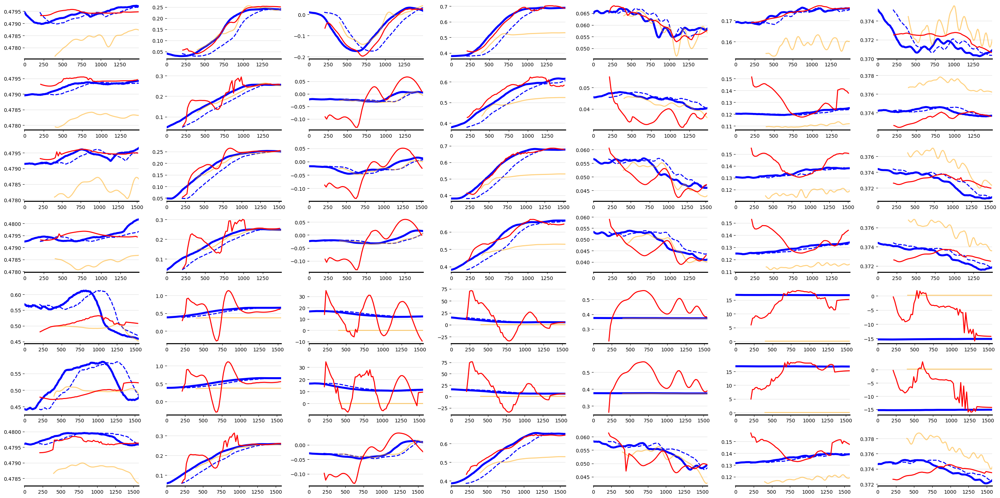

In [74]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [75]:
print(task_list)
print(all_preds_promp.keys())
task = 'PlaceBoxSide'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

['PlaceBoxDown', 'BottleTable', 'PickBoxMid', 'PickBoxLow', 'PlaceBoxTable', 'BottleBox', 'PlaceBoxSide', 'PlaceBoxHigh', 'PickBoxTable']
dict_keys(['PlaceBoxDown', 'BottleTable', 'PickBoxMid', 'PickBoxLow', 'PlaceBoxTable', 'BottleBox'])
Task: PlaceBoxSide / DOF 0...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:53<02:40, 53.55s/it]

1/4


 50%|█████     | 2/4 [01:46<01:46, 53.27s/it]

2/4


 75%|███████▌  | 3/4 [02:40<00:53, 53.36s/it]

3/4


100%|██████████| 4/4 [03:33<00:00, 53.29s/it]


Task: PlaceBoxSide / DOF 1...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:51<02:35, 51.85s/it]

1/4


 50%|█████     | 2/4 [01:43<01:43, 51.60s/it]

2/4


 75%|███████▌  | 3/4 [02:36<00:52, 52.29s/it]

3/4


100%|██████████| 4/4 [03:29<00:00, 52.31s/it]


Task: PlaceBoxSide / DOF 2...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:52<02:36, 52.23s/it]

1/4


 50%|█████     | 2/4 [01:44<01:44, 52.13s/it]

2/4


 75%|███████▌  | 3/4 [02:37<00:52, 52.48s/it]

3/4


100%|██████████| 4/4 [03:30<00:00, 52.67s/it]


Task: PlaceBoxSide / DOF 3...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:52<02:37, 52.36s/it]

1/4


 50%|█████     | 2/4 [01:45<01:45, 52.88s/it]

2/4


 75%|███████▌  | 3/4 [02:38<00:53, 53.08s/it]

3/4


100%|██████████| 4/4 [03:32<00:00, 53.16s/it]


Task: PlaceBoxSide / DOF 4...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:51<02:33, 51.32s/it]

1/4


 50%|█████     | 2/4 [01:42<01:42, 51.50s/it]

2/4


 75%|███████▌  | 3/4 [02:36<00:52, 52.38s/it]

3/4


100%|██████████| 4/4 [03:28<00:00, 52.19s/it]


Task: PlaceBoxSide / DOF 5...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:52<02:38, 52.77s/it]

1/4


 50%|█████     | 2/4 [01:44<01:44, 52.37s/it]

2/4


 75%|███████▌  | 3/4 [02:37<00:52, 52.61s/it]

3/4


100%|██████████| 4/4 [03:30<00:00, 52.71s/it]


Task: PlaceBoxSide / DOF 6...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:52<02:36, 52.10s/it]

1/4


 50%|█████     | 2/4 [01:45<01:45, 52.61s/it]

2/4


 75%|███████▌  | 3/4 [02:38<00:52, 52.93s/it]

3/4


100%|██████████| 4/4 [03:31<00:00, 52.88s/it]


100%|██████████| 4/4 [00:00<00:00,  5.49it/s]


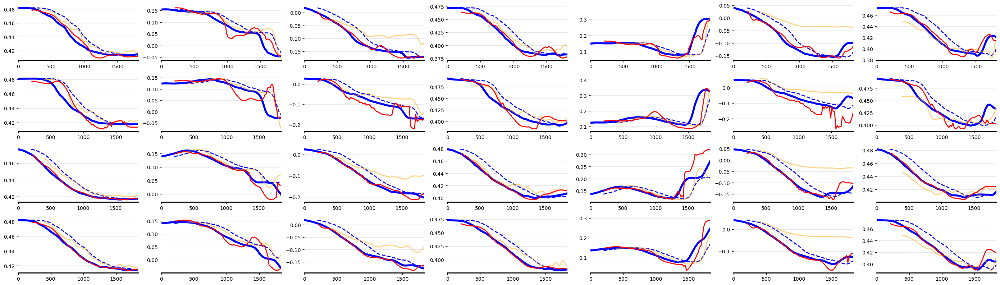

In [76]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [77]:
task = 'PlaceBoxHigh'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

Task: PlaceBoxHigh / DOF 0...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:50<02:31, 50.60s/it]

1/4


 50%|█████     | 2/4 [01:42<01:42, 51.14s/it]

2/4


 75%|███████▌  | 3/4 [02:30<00:50, 50.00s/it]

3/4


100%|██████████| 4/4 [03:21<00:00, 50.32s/it]


Task: PlaceBoxHigh / DOF 1...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:51<02:33, 51.19s/it]

1/4


 50%|█████     | 2/4 [01:44<01:44, 52.42s/it]

2/4


 75%|███████▌  | 3/4 [02:33<00:50, 50.76s/it]

3/4


100%|██████████| 4/4 [03:25<00:00, 51.25s/it]


Task: PlaceBoxHigh / DOF 2...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:50<02:31, 50.56s/it]

1/4


 50%|█████     | 2/4 [01:42<01:42, 51.46s/it]

2/4


 75%|███████▌  | 3/4 [02:31<00:50, 50.19s/it]

3/4


100%|██████████| 4/4 [03:23<00:00, 50.91s/it]


Task: PlaceBoxHigh / DOF 3...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:52<02:38, 52.72s/it]

1/4


 50%|█████     | 2/4 [01:47<01:47, 53.74s/it]

2/4


 75%|███████▌  | 3/4 [02:37<00:52, 52.19s/it]

3/4


100%|██████████| 4/4 [03:29<00:00, 52.46s/it]


Task: PlaceBoxHigh / DOF 4...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:50<02:32, 50.88s/it]

1/4


 50%|█████     | 2/4 [01:44<01:44, 52.36s/it]

2/4


 75%|███████▌  | 3/4 [02:33<00:50, 50.87s/it]

3/4


100%|██████████| 4/4 [03:25<00:00, 51.27s/it]


Task: PlaceBoxHigh / DOF 5...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:49<02:29, 49.99s/it]

1/4


 50%|█████     | 2/4 [01:42<01:43, 51.54s/it]

2/4


 75%|███████▌  | 3/4 [02:31<00:50, 50.13s/it]

3/4


100%|██████████| 4/4 [03:22<00:00, 50.69s/it]


Task: PlaceBoxHigh / DOF 6...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:51<02:33, 51.05s/it]

1/4


 50%|█████     | 2/4 [01:44<01:44, 52.22s/it]

2/4


 75%|███████▌  | 3/4 [02:32<00:50, 50.45s/it]

3/4


100%|██████████| 4/4 [03:24<00:00, 51.06s/it]


100%|██████████| 4/4 [00:00<00:00, 10.38it/s]


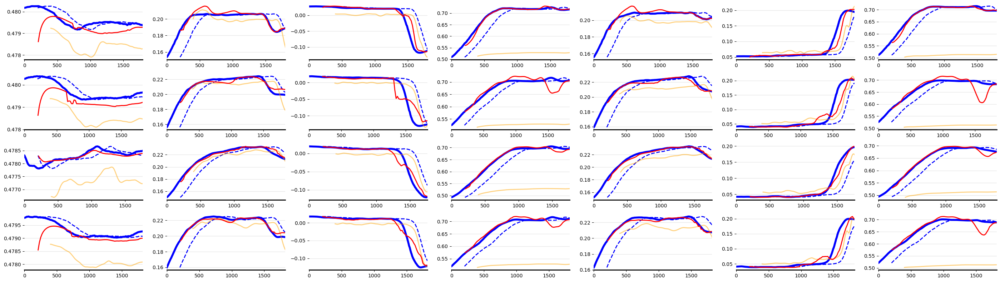

In [78]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

In [79]:
task = 'PickBoxTable'
all_preds_promp[task], all_preds_lstm[task], gt[task] = prediction_task(task)

Task: PickBoxTable / DOF 0...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:29<01:29, 29.93s/it]

1/4


 50%|█████     | 2/4 [01:00<01:00, 30.31s/it]

2/4


 75%|███████▌  | 3/4 [01:31<00:30, 30.53s/it]

3/4


100%|██████████| 4/4 [02:02<00:00, 30.72s/it]


Task: PickBoxTable / DOF 1...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:30<01:31, 30.63s/it]

1/4


 50%|█████     | 2/4 [01:01<01:00, 30.49s/it]

2/4


 75%|███████▌  | 3/4 [01:31<00:30, 30.44s/it]

3/4


100%|██████████| 4/4 [02:03<00:00, 30.78s/it]


Task: PickBoxTable / DOF 2...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:30<01:31, 30.62s/it]

1/4


 50%|█████     | 2/4 [01:01<01:01, 30.89s/it]

2/4


 75%|███████▌  | 3/4 [01:32<00:30, 30.87s/it]

3/4


100%|██████████| 4/4 [02:05<00:00, 31.37s/it]


Task: PickBoxTable / DOF 3...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:31<01:33, 31.32s/it]

1/4


 50%|█████     | 2/4 [01:02<01:01, 30.98s/it]

2/4


 75%|███████▌  | 3/4 [01:32<00:30, 30.77s/it]

3/4


100%|██████████| 4/4 [02:04<00:00, 31.13s/it]


Task: PickBoxTable / DOF 4...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:30<01:31, 30.37s/it]

1/4


 50%|█████     | 2/4 [01:00<01:00, 30.48s/it]

2/4


 75%|███████▌  | 3/4 [01:31<00:30, 30.34s/it]

3/4


100%|██████████| 4/4 [02:03<00:00, 30.80s/it]


Task: PickBoxTable / DOF 5...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:30<01:31, 30.41s/it]

1/4


 50%|█████     | 2/4 [01:01<01:01, 30.65s/it]

2/4


 75%|███████▌  | 3/4 [01:31<00:30, 30.62s/it]

3/4


100%|██████████| 4/4 [02:03<00:00, 30.89s/it]


Task: PickBoxTable / DOF 6...


  0%|          | 0/4 [00:00<?, ?it/s]

0/4


 25%|██▌       | 1/4 [00:30<01:32, 30.89s/it]

1/4


 50%|█████     | 2/4 [01:01<01:01, 30.68s/it]

2/4


 75%|███████▌  | 3/4 [01:31<00:30, 30.52s/it]

3/4


100%|██████████| 4/4 [02:03<00:00, 30.90s/it]


100%|██████████| 4/4 [00:00<00:00,  5.44it/s]


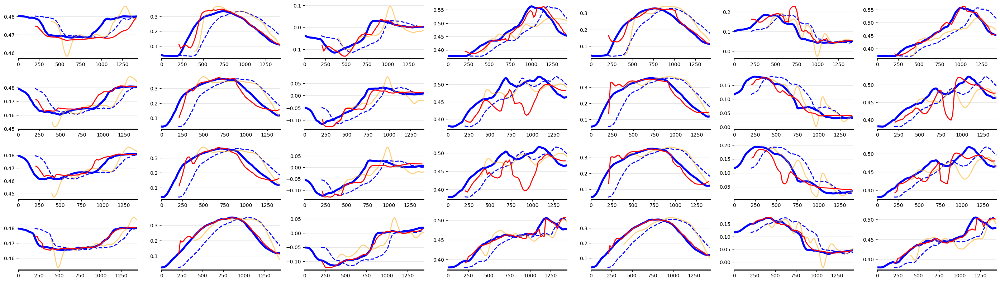

In [80]:
plot_prediction(task, all_preds_promp[task], all_preds_lstm[task])

## Comparisons of errors

6


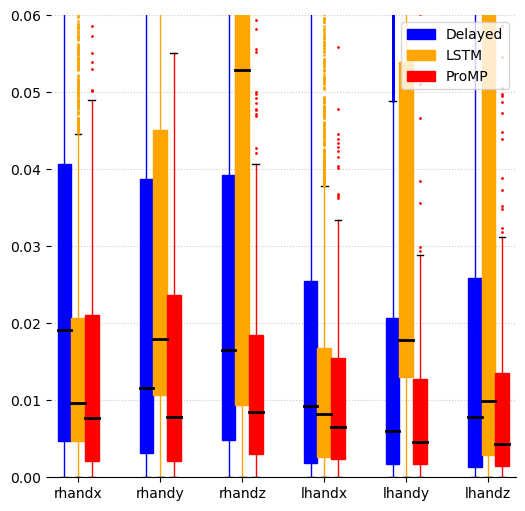

In [81]:
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(1,1, 1)

# delayed
delayed = []
for i in range(len(dofs)):
    delayed += [[j for t in rms_delayed.keys() for j in rms_delayed[t][i]]]
# promp
promp = []
for i in range(len(dofs)):
    promp += [[j for t in rms_promp.keys() for j in rms_promp[t][i]]]
# lstm
lstm_errors_plot = [lstm_errors[k] for k in range(0, len(lstm_errors.keys()))]

ind = np.arange(len(promp[1:])) # x
print(len(promp[1:]))
colors = ['blue', 'orange', 'red', ]

ax.grid(color='#cccccc',linestyle='dotted', axis='y')
bp1 = ax.boxplot(delayed[1:], positions=ind*3-0.5, patch_artist=True, flierprops={'marker': 'o', 'markersize': 2, 'markeredgecolor':'none', 'markerfacecolor': colors[0]})
bp2 = ax.boxplot(lstm_errors_plot[1:], positions=ind*3, patch_artist=True,flierprops={'marker': 'o', 'markersize': 2, 'markeredgecolor':'none', 'markerfacecolor': colors[1]})
bp3 = ax.boxplot(promp[1:], positions=ind*3 + 0.5, patch_artist=True,flierprops={'marker': 'o', 'markersize': 2, 'markeredgecolor':'none', 'markerfacecolor': colors[2]})


for c, bplot in zip(colors, (bp1, bp2, bp3)):
    for w in bplot['whiskers']:
        w.set_color(c)
    for patch in bplot['boxes']:
        patch.set_facecolor(c)
        patch.set_color(c)
    for median in bplot['medians']:
        median.set(color ='black',
                    linewidth = 2)
        

ax.set_ylim([0, 0.06])
ax.set_xticks(ind*3)
ax.set_xticklabels([dofs[i+1] for i in ind])
ax.legend([bp1["boxes"][0], bp2["boxes"][0], bp3["boxes"][0]], ['Delayed', 'LSTM', 'ProMP'], loc='upper right')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)

fig.savefig(f"pred_errors_{horizon}.pdf")


In [82]:
import scipy.stats
for i in range(0, 6):
    _, p = scipy.stats.mannwhitneyu(lstm_errors_plot[i], promp[i])
    print(dofs[i], "LSTM vs ProMP: p-value:", p)
for i in range(0, 6):
    _, p = scipy.stats.mannwhitneyu(lstm_errors_plot[i], delayed[i])
    print(dofs[i], "LSTM vs delayed: p-value:", p)
for i in range(0, 6):
    _, p = scipy.stats.mannwhitneyu(promp[i], delayed[i])
    print(dofs[i], "Promp vs delayed: p-value:", p)


waistz LSTM vs ProMP: p-value: 3.10989454122284e-14
rhandx LSTM vs ProMP: p-value: 4.171538575727737e-05
rhandy LSTM vs ProMP: p-value: 1.911505792809357e-24
rhandz LSTM vs ProMP: p-value: 1.1362104288805642e-40
lhandx LSTM vs ProMP: p-value: 0.04129947619353399
lhandy LSTM vs ProMP: p-value: 7.58198786808003e-66
waistz LSTM vs delayed: p-value: 5.06616030471052e-216
rhandx LSTM vs delayed: p-value: 8.500103551554122e-88
rhandy LSTM vs delayed: p-value: 3.82884794618796e-152
rhandz LSTM vs delayed: p-value: 0.0
lhandx LSTM vs delayed: p-value: 0.013534855393994643
lhandy LSTM vs delayed: p-value: 0.0
waistz Promp vs delayed: p-value: 0.6435803291513589
rhandx Promp vs delayed: p-value: 8.004441395497517e-14
rhandy Promp vs delayed: p-value: 0.0002303327239291764
rhandz Promp vs delayed: p-value: 1.603279978721617e-10
lhandx Promp vs delayed: p-value: 0.01865780382285236
lhandy Promp vs delayed: p-value: 0.032597417437106924
